# HBM - experiments

## Data and imports

In [1]:
# MPL stuff
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
import matplotlib.pyplot as plt

import matplotlib
plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.weight": "medium",
    "font.serif": "cmr10",  # cmr10 is part of Computer Modern Roman
    "axes.labelsize": 12,   # Corresponds to 12pt
    "font.size": 12,        # General font size
    "legend.fontsize": 12,  # Legend font size
    "xtick.labelsize": 12,  # X-axis tick label size
    "ytick.labelsize": 12,  # Y-axis tick label size
    'axes.formatter.use_mathtext': True,
    "axes.spines.right": False,
    "axes.spines.top": False,
    "legend.frameon": False,
})


# colours
from tol_colors import tol_cmap, tol_cset
cmap = tol_cset('vibrant')


# additional packages
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm.notebook import tqdm_notebook


# Model stuff -- using PMT
import sys
sys.path.append("../../models/bcts")

from model.model import *
from model.model_presets import BASELINE_MODEL, HIGH_MOVEMENT


# Utils
def derive_mu_sigma_lognormal(mean, variance):
    """Given mu and sigma from a log-normal distribution, find the mean and variance."""
    sigma = np.sqrt(np.log(variance/(mean**2) + 1))
    mu    = np.log(mean) - .5*(sigma**2)
    return mu, sigma

def run_model(n, names, param_sets, debug=True):
    """Run the model for `n` runs per scenario under each name-parameters pair."""
    data = {name: None for name in names}

    for name, params in zip(names, param_sets):
        if debug: print(f"Running scenario '{name}'...")
        
        scenario_res = [None] * n
        for i in tqdm_notebook(range(n)):
            m = BaselineModel(**params)
            run, _ = m.run()

            scenario_res[i] = run

            # add additional info for number of agents in occupations
            scenario_res[i]["amts"] = (np.sum([a.forest_worker for a in m.agents]),
                                        np.sum([a.field_worker for a in m.agents]),
                                        np.sum([not (a.forest_worker or a.field_worker) for a in m.agents]))
        data[name] = scenario_res

    return data


def plot_colours(cmap):
    colors = matplotlib.colors.ListedColormap(cmap)(np.arange(len(cmap)))
    
    # Display the colors
    fig, ax = plt.subplots(figsize=(8, 2))
    ax.imshow([colors], extent=[0, len(cmap), 0, 1])
    ax.set_xticks(np.arange(len(cmap)) + 0.5)
    ax.set_xticklabels(np.arange(len(cmap)))
    ax.set_yticks([])  # Remove y-axis ticks
    plt.show()


def run_similarity_orderings(arrs):
    """Requires `arrs`, a (num_runs) x (num_points) matrix.
    
    Uses Euclidean distances to sort indices in ascending order of
    pairwise distance."""
    dists = np.zeros(len(arrs))
    
    for r in range(len(arrs)):
        dists[r] = np.sqrt(np.sum((np.delete(arrs, r, axis=0) - arrs[r, :])**2, axis=1).sum())

    return np.arange(0, len(arrs))[np.argsort(dists)]


def tricolor(c, amount=0.5):
    """Takes a colour `c`, lightens it, darkens it, and returns [light, `c`, dark]"""
    import colorsys
    
    h, l, s = colorsys.rgb_to_hls(*matplotlib.colors.to_rgb(c))
    c1 = colorsys.hls_to_rgb(h, 1 - amount * (1 - l), s)
    c2 = colorsys.hls_to_rgb(h, 1 - amount * (1 - (1-l)), s)
    
    return [c1, c, c2]


# Deriving ideal fig size
pt = 1./72.27
my_width = 426.79135*pt
golden = (1 + 5 ** 0.5) / 2
IDEAL_FIG_SIZE = (my_width, my_width/golden)

# Setting seed for reproducibility
np.random.seed(1389498)

In [7]:
def derive_mu_sigma_lognormal(mean, variance):
    sigma = np.sqrt(np.log(variance/(mean**2) + 1))
    mu    = np.log(mean) - .5*(sigma**2)
    return mu, sigma

RAINY_SEASON = {
    "k" : 3,
    "timestep" : (2/24),
    "movement_dist" : lambda : np.random.lognormal(*derive_mu_sigma_lognormal(1, .001)),
    "sigma_h_arr" : np.array([19, 19, 19]),
    "sigma_v_arr" : np.array([.5, .5, .5]),
    "K_v_arr" : np.array([2750, 8250, 9625]),
    "patch_densities" : np.array([.85, .08, .07]),
    "psi_v_arr" : np.array([.3, .3, .3]),
    "beta_hv_arr" : np.array([.33, .33, .33]),
    "beta_vh_arr" : np.array([.33, .33, .33]),
    "nu_v_arr" : np.array([.1, .1, .1]),
    "mu_v_arr" : np.array([1/14, 1/14, 1/14]),
    "num_households" : 2_351,
    "edge_prob" : .03,
    "num_agents" : 10_053,
    "initial_infect_proportion" : .005,
    "patch_init_infect_vector_prop_arr" : [.0, .0, .0],
    # "patch_init_infect_vector_prop_arr" : [.0555, .0286, .011],
    "nu_h_dist" : lambda : np.random.lognormal(*derive_mu_sigma_lognormal(1/5, .001)),
    "mu_h_dist" : lambda : np.random.lognormal(*derive_mu_sigma_lognormal(1/6, .001)),
    "total_time" : 200,
    "mosquito_timestep" : .005,
    "prob_adopt_itn": .0,
    "stay_home_chance": .0,
    "high_severity": False,
    "high_benefits": True,
    "high_barriers": False,
}

DRY_SEASON = {
    "k" : 3,
    "timestep" : (2/24),
    "movement_dist" : lambda : np.random.lognormal(*derive_mu_sigma_lognormal(1, .001)),
    "sigma_h_arr" : np.array([19, 19, 19]),
    "sigma_v_arr" : np.array([.5, .5, .5]),
    "K_v_arr" : np.array([1146, 3438, 9625]),
    "patch_densities" : np.array([.85, .08, .07]),
    "psi_v_arr" : np.array([.3, .3, .3]),
    "beta_hv_arr" : np.array([.33, .33, .33]),
    "beta_vh_arr" : np.array([.33, .33, .33]),
    "nu_v_arr" : np.array([.1, .1, .1]),
    "mu_v_arr" : np.array([1/14, 1/14, 1/14]),
    "num_households" : 2_351,
    "edge_prob" : .03,
    "num_agents" : 10_053,
    "initial_infect_proportion" : .005,
    "patch_init_infect_vector_prop_arr" : [.0, .0, .0],
    # "patch_init_infect_vector_prop_arr" : [.0555, .0286, .011],
    "nu_h_dist" : lambda : np.random.lognormal(*derive_mu_sigma_lognormal(1/5, .001)),
    "mu_h_dist" : lambda : np.random.lognormal(*derive_mu_sigma_lognormal(1/6, .001)),
    "total_time" : 200,
    "mosquito_timestep" : .005,
    "prob_adopt_itn": .0,
    "stay_home_chance": .0,
    "high_severity": False,
    "high_benefits": False,
    "high_barriers": True,
}

## Rainy

In [3]:
m = BaselineModel(**RAINY_SEASON)
data, _ = m.run(with_progress=True)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 2400/2400 [01:47<00:00, 22.42it/s]


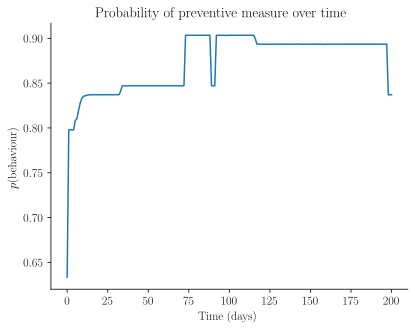

In [4]:
plt.plot(data['prob_values'][data['prob_values'].nonzero()])

# plt.axhline(0.7289972899728997, ls='dashed', c='black')
# plt.axhline(0.5877478665952096, ls='dashed', c='black')

plt.xlabel("Time (days)")
plt.ylabel(r"$p(\mathrm{behaviour})$")
plt.title("Probability of preventive measure over time")
plt.show()

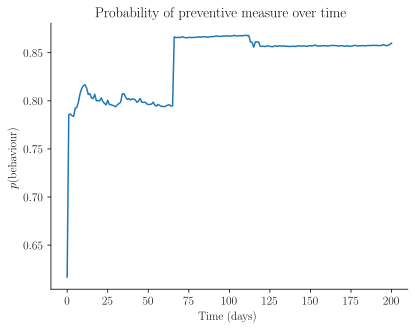

In [5]:
plt.plot(data['prob_values'][data['prob_values'].nonzero()])

# plt.axhline(0.7289972899728997, ls='dashed', c='black')
# plt.axhline(0.5877478665952096, ls='dashed', c='black')

plt.xlabel("Time (days)")
plt.ylabel(r"$p(\mathrm{behaviour})$")
plt.title("Probability of preventive measure over time")
plt.show()

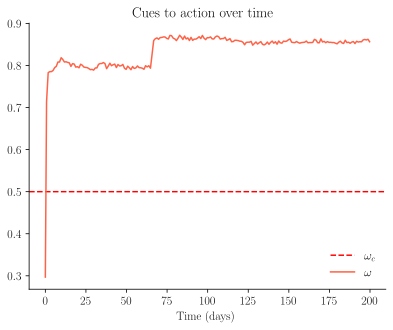

In [6]:
p_inds = data["prob_values"].nonzero()
t = np.array(data['time'])

# plt.plot(t[p_inds], data["used_itn"][p_inds]/10_053, color='black', label=r"ITN use rate")
# plt.plot(t[p_inds], data["prob_values"][p_inds], color='black', label=r"$p(\text{behaviour})$")
# plt.plot(t[p_inds], data["chi"][p_inds], color='steelblue', label=r"$\chi$")
# plt.axhline(.5, linestyle='dashed', c='steelblue', label=r"$\chi_c$")
# plt.axhline(.73)
# plt.axhline(.587)

plt.axhline(m.agents[0].hbm.omega, linestyle='dashed', c='red', label=r"$\omega_c$")
plt.plot(t[p_inds], data["omega"][p_inds], color="tomato", label=r"$\omega$")

plt.legend()
plt.xlabel("Time (days)")
plt.title("Cues to action over time")
plt.show()

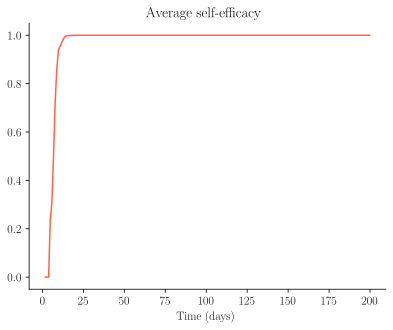

In [7]:
p_inds = data["prob_values"].nonzero()
t = np.array(data['time'])

# plt.plot(t[p_inds], data["used_itn"][p_inds]/10_053, color='black', label=r"ITN use rate")
# plt.plot(t[p_inds], data["prob_values"][p_inds], color='black', label=r"$p(\text{behaviour})$")
# plt.plot(t[p_inds], data["chi"][p_inds], color='steelblue', label=r"$\chi$")
# plt.axhline(.5, linestyle='dashed', c='steelblue', label=r"$\chi_c$")
# plt.axhline(.73)
# plt.axhline(.587)

# plt.axhline(m.agents[0].hbm.omega, linestyle='dashed', c='red', label=r"$\omega_c$")
plt.plot(t[p_inds][2:], data["self_eff"][p_inds][2:], color="tomato")


plt.xlabel("Time (days)")
plt.title("Average self-efficacy")
plt.savefig("pmt_figs/self_eff.png", dpi=330)

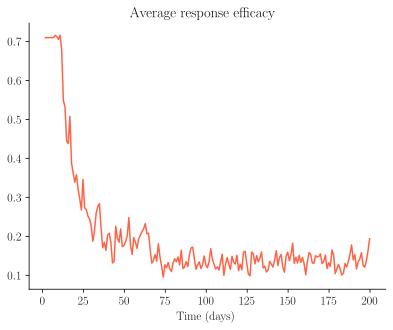

In [8]:
p_inds = data["prob_values"].nonzero()
t = np.array(data['time'])

# plt.plot(t[p_inds], data["used_itn"][p_inds]/10_053, color='black', label=r"ITN use rate")
# plt.plot(t[p_inds], data["prob_values"][p_inds], color='black', label=r"$p(\text{behaviour})$")
# plt.plot(t[p_inds], data["chi"][p_inds], color='steelblue', label=r"$\chi$")
# plt.axhline(.5, linestyle='dashed', c='steelblue', label=r"$\chi_c$")
# plt.axhline(.73)
# plt.axhline(.587)

# plt.axhline(m.agents[0].hbm.omega, linestyle='dashed', c='red', label=r"$\omega_c$")
plt.plot(t[p_inds][2:], data["chi"][p_inds][2:], color="tomato")

plt.xlabel("Time (days)")
plt.title("Average response efficacy")
plt.savefig("pmt_figs/response_eff.png", dpi=330)

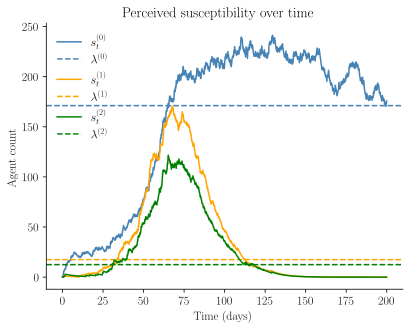

In [9]:
delta_val = .99#m._hbm_delta_val

for patch_id, c in enumerate(['steelblue', 'orange', 'green']):
    c_ts = [np.sum([(delta_val**i)*(m.c_t[patch_id][j-i-1]) for i in range(j)]) for j in range(m.tick_counter)]
    plt.plot(data['time'], c_ts, color=c, label=r"$s_t^{({"+str(patch_id)+r"})}$")
    plt.axhline(m.s_stars[patch_id], color=c, linestyle='dashed', label=r"$\lambda^{({"+str(patch_id)+r"})}$")
    
# plt.axhline(m.agents[0].hbm.s_star, c='black', linestyle='dashed', label=r"$\lambda$")
plt.xlabel("Time (days)")
plt.ylabel("Agent count")

plt.legend()
plt.title("Perceived susceptibility over time")
plt.show()

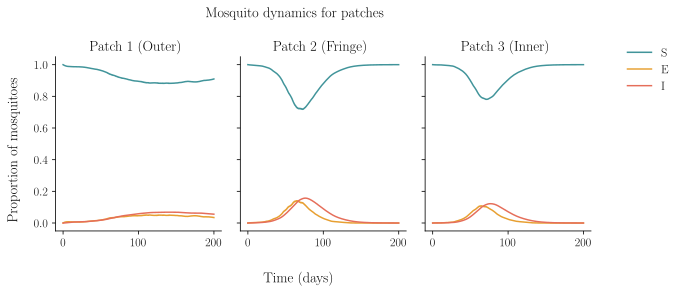

In [10]:
names = ["Patch 1 (Outer)", "Patch 2 (Fringe)", "Patch 3 (Inner)"]
labels= ["S", "E", "I"]

fig, axs = plt.subplots(nrows=1, ncols=3, sharey=True, figsize=(8.5,4))
cur_name = 0

for i, col in enumerate(axs):
    for j, c, l in zip(range(len(axs)), ["#41949A", "#e79f31", "#E56E5A", "#7384BB"], labels):
        if i == 0:
            axs[i].plot(np.arange(0, m.total_time, m.timestep), data["patch_sei"][i].T[j]/m.K_v_arr[i], color=c, label=l)
        else:
            axs[i].plot(np.arange(0, m.total_time, m.timestep), data["patch_sei"][i].T[j]/m.K_v_arr[i], color=c)
#     for (i, color, args) in zip(range(3), range(1,4), ["steelblue", "green", "red"], [{}, {"marker": "o", "markevery": 15}, {"linestyle": "dashed"}]):
#         sns.kdeplot(peak_infection_times[temp_names[cur_name]][patch], ax=col, bw_adjust=.5, color=color, label=f"Patch {name}" if cur_name == 0 else None, **args)

#     col.set_xlim(0,200)
    
#     col.set_xlabel("")
#     col.set_ylabel("")

    col.set_title(names[i])
    
#     cur_name += 1

fig.suptitle("Mosquito dynamics for patches")

fig.supxlabel("Time (days)")
fig.supylabel("Proportion of mosquitoes")
fig.legend(bbox_to_anchor=[1.12, 0.875])
fig.tight_layout()
plt.savefig("img/v3_3_0itn_mosq", dpi=330)

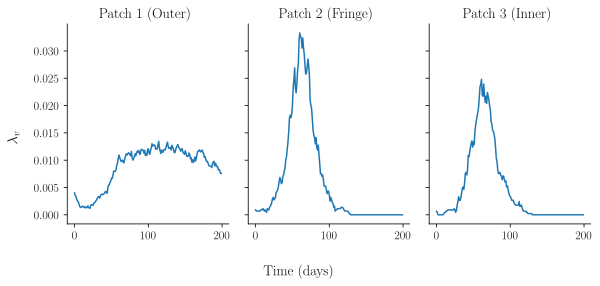

In [11]:
fig, axs = plt.subplots(nrows=1, ncols=3, sharey=True, figsize=(8.5,4))
cur_name = 0

for i, col in enumerate(axs):
    axs[i].plot(data['time'][::12], data["lambda_v"][i][::12])
    col.set_title(names[i])

fig.supxlabel(r"Time (days)")
fig.supylabel(r"$\lambda_v$")
fig.tight_layout()
plt.savefig("img/lambda_v_patch", dpi=330)

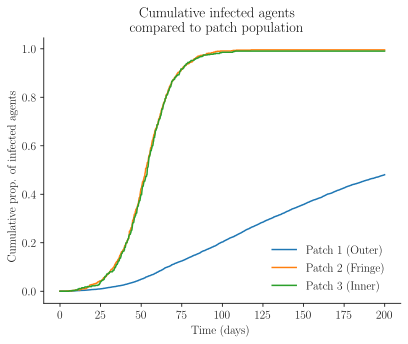

In [12]:
df = pd.DataFrame(data["infection_records"])
patch_pops = [np.sum([a.node.patch_id == j for a in m.agents]) for j in range(3)]

for i in range(3):
    vals = np.zeros(m.tick_counter)
    infs = df[df.home_patch == i].groupby(by=['time']).size().reset_index()
    vals[infs.time] = infs.iloc[:, 1]
    
    plt.plot(np.arange(0, m.total_time, m.timestep),
             vals.cumsum()/patch_pops[i],
            label=names[i])

plt.title("Cumulative infected agents\ncompared to patch population")
plt.xlabel("Time (days)")
plt.ylabel("Cumulative prop. of infected agents")
plt.legend()
plt.savefig("img/patch_infections_t", dpi=330)

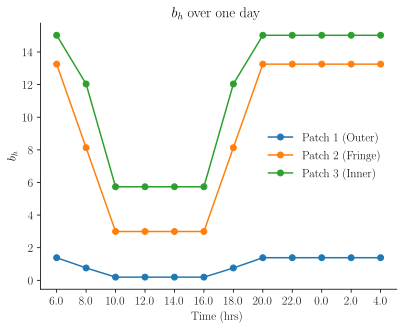

In [13]:
df = pd.DataFrame(data["patch_values"])
tick_start = 27 * 1
t = np.arange(start_time:=(tick_start*m.timestep*24 % 24), # time in simulation (hrs)
              start_time+24, # 1 day window
              step=24*m.timestep)

for i in range(3):
    plt.plot(t,
             df[df.patch_id == i].b_h.reset_index(drop=True)[tick_start:tick_start+int(1/m.timestep)],
            'o-',
            label=names[i]) #TODO: plot actual time, compare patches.
plt.xticks(t, labels=t % 24)

plt.title(r"$b_h$ over one day")
plt.xlabel("Time (hrs)")
plt.ylabel(r"$b_h$")
plt.legend()
plt.savefig("img/b_h_patch", dpi=330)

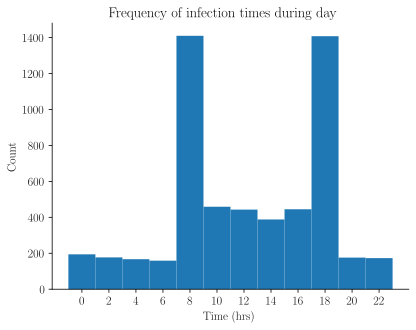

In [14]:
df = pd.DataFrame(data["infection_records"])

# plt.hist((df.time * m.timestep * 24) % 24, bins=12)
plt.bar(np.arange(0,24,2), np.unique(((df.time * m.timestep * 24) % 24).map(np.round), return_counts=True)[1], width=2)
plt.xticks(np.arange(0,24,2))
plt.title("Frequency of infection times during day")
plt.xlabel("Time (hrs)")
plt.ylabel("Count")

plt.savefig("img/infection_times", dpi=330)

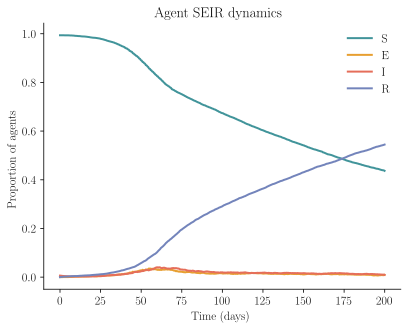

In [15]:
for j, c in zip(range(4), ["#41949A", "#e79f31", "#E56E5A", "#7384BB"]):
    plt.plot(np.arange(0, m.total_time, m.timestep), np.sum(data["agent_disease_counts"],axis=0)[j]/m.num_agents, color=c, lw=2, label=(labels+["R"])[j])
plt.xlabel("Time (days)")
plt.ylabel("Proportion of agents")
plt.title("Agent SEIR dynamics")
plt.legend()
# plt.xlim(85,100)
plt.savefig("img/v3_3_0itn_agent",dpi=330)

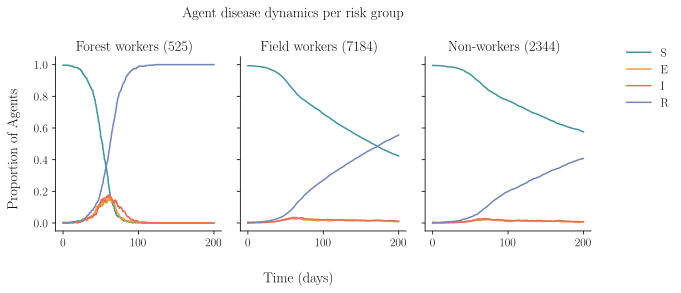

In [16]:
amts = (np.sum([a.forest_worker for a in m.agents]),
        np.sum([a.field_worker for a in m.agents]),
        np.sum([not (a.forest_worker or a.field_worker) for a in m.agents]))
names = ["Forest workers", "Field workers", "Non-workers"]
labels= ["S", "E", "I", "R"]

fig, axs = plt.subplots(nrows=1, ncols=3, sharey=True, figsize=(8.5,4))
cur_name = 0

for i, col in enumerate(axs):
    for j, c, l in zip(range(len(labels)), ["#41949A", "#e79f31", "#E56E5A", "#7384BB"], labels):
        if i == 0:
            axs[i].plot(np.arange(0, m.total_time, m.timestep), data["agent_disease_counts"][i][j]/amts[i], color=c, label=l)
        else:
            axs[i].plot(np.arange(0, m.total_time, m.timestep), data["agent_disease_counts"][i][j]/amts[i], color=c)
    col.set_title(names[i] + f" ({amts[i]})")
    
fig.suptitle("Agent disease dynamics per risk group")

fig.supxlabel("Time (days)")
fig.supylabel("Proportion of Agents")
fig.legend(bbox_to_anchor=[1.12, 0.875])
fig.tight_layout()
plt.savefig("img/v3_3_0itn_agent_risk_groups", dpi=330)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: 

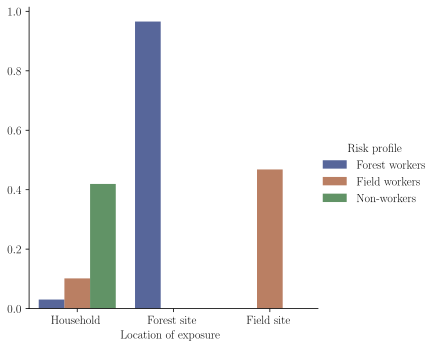

In [17]:
df = pd.DataFrame(data["infection_records"]).groupby(by=["worker_type", "activity_id"]).size().reset_index(name="num")
df["num"] = df.num.map(float)

for i, _ in df.iterrows():
    df.iloc[i, 2] /= amts[(df.iloc[i,0])]

df["worker_type"] = df.worker_type.map({0: "Forest workers", 1: "Field workers", 2: "Non-workers"})
df["activity_id"] = df.activity_id.map({0: "Household", 1: "Forest site", 2: "Field site"})

g = sns.catplot(
    data=df,
    kind="bar",
    x="activity_id",
    y="num",
    hue="worker_type",
    # errorbar="sd",
    palette="dark",
    alpha=.7,
)
# g.despine(left=True)
g.set_axis_labels("Location of exposure", "% of risk profile infected")
g.legend.set_title("Risk profile")
plt.show()

## Dry

In [8]:
m = BaselineModel(**DRY_SEASON)
data, _ = m.run(with_progress=True)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 2400/2400 [01:51<00:00, 21.45it/s]


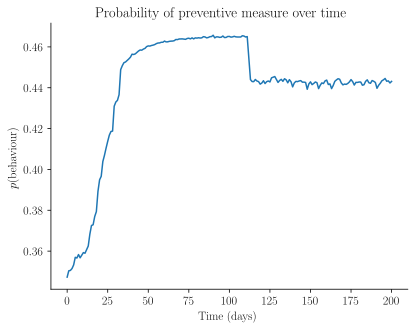

In [9]:
plt.plot(data['prob_values'][data['prob_values'].nonzero()])

# plt.axhline(0.7289972899728997, ls='dashed', c='black')
# plt.axhline(0.5877478665952096, ls='dashed', c='black')

plt.xlabel("Time (days)")
plt.ylabel(r"$p(\mathrm{behaviour})$")
plt.title("Probability of preventive measure over time")
plt.show()

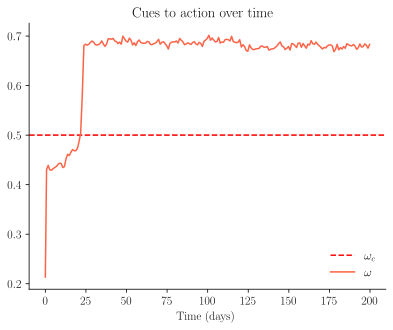

In [20]:
p_inds = data["prob_values"].nonzero()
t = np.array(data['time'])

# plt.plot(t[p_inds], data["used_itn"][p_inds]/10_053, color='black', label=r"ITN use rate")
# plt.plot(t[p_inds], data["prob_values"][p_inds], color='black', label=r"$p(\text{behaviour})$")
# plt.plot(t[p_inds], data["chi"][p_inds], color='steelblue', label=r"$\chi$")
# plt.axhline(.5, linestyle='dashed', c='steelblue', label=r"$\chi_c$")
# plt.axhline(.73)
# plt.axhline(.587)

plt.axhline(m.agents[0].hbm.omega, linestyle='dashed', c='red', label=r"$\omega_c$")
plt.plot(t[p_inds], data["omega"][p_inds], color="tomato", label=r"$\omega$")

plt.legend()
plt.xlabel("Time (days)")
plt.title("Cues to action over time")
plt.show()

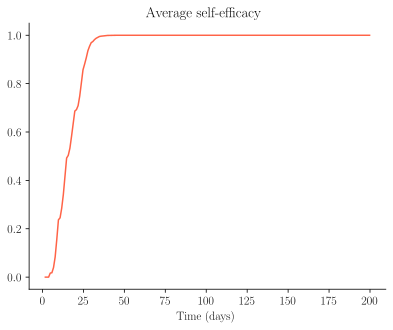

In [21]:
p_inds = data["prob_values"].nonzero()
t = np.array(data['time'])

# plt.plot(t[p_inds], data["used_itn"][p_inds]/10_053, color='black', label=r"ITN use rate")
# plt.plot(t[p_inds], data["prob_values"][p_inds], color='black', label=r"$p(\text{behaviour})$")
# plt.plot(t[p_inds], data["chi"][p_inds], color='steelblue', label=r"$\chi$")
# plt.axhline(.5, linestyle='dashed', c='steelblue', label=r"$\chi_c$")
# plt.axhline(.73)
# plt.axhline(.587)

# plt.axhline(m.agents[0].hbm.omega, linestyle='dashed', c='red', label=r"$\omega_c$")
plt.plot(t[p_inds][2:], data["self_eff"][p_inds][2:], color="tomato")


plt.xlabel("Time (days)")
plt.title("Average self-efficacy")
plt.savefig("pmt_figs/self_eff.png", dpi=330)

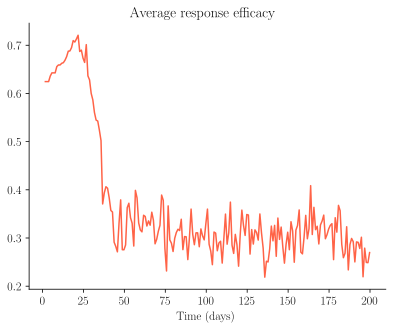

In [22]:
p_inds = data["prob_values"].nonzero()
t = np.array(data['time'])

# plt.plot(t[p_inds], data["used_itn"][p_inds]/10_053, color='black', label=r"ITN use rate")
# plt.plot(t[p_inds], data["prob_values"][p_inds], color='black', label=r"$p(\text{behaviour})$")
# plt.plot(t[p_inds], data["chi"][p_inds], color='steelblue', label=r"$\chi$")
# plt.axhline(.5, linestyle='dashed', c='steelblue', label=r"$\chi_c$")
# plt.axhline(.73)
# plt.axhline(.587)

# plt.axhline(m.agents[0].hbm.omega, linestyle='dashed', c='red', label=r"$\omega_c$")
plt.plot(t[p_inds][2:], data["chi"][p_inds][2:], color="tomato")

plt.xlabel("Time (days)")
plt.title("Average response efficacy")
plt.savefig("pmt_figs/response_eff.png", dpi=330)

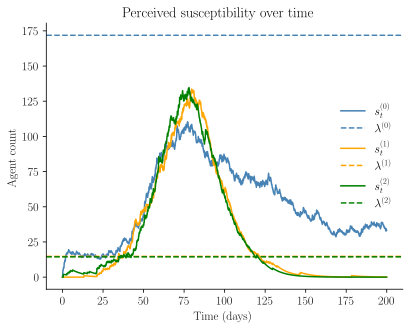

In [23]:
delta_val = .99#m._hbm_delta_val

for patch_id, c in enumerate(['steelblue', 'orange', 'green']):
    c_ts = [np.sum([(delta_val**i)*(m.c_t[patch_id][j-i-1]) for i in range(j)]) for j in range(m.tick_counter)]
    plt.plot(data['time'], c_ts, color=c, label=r"$s_t^{({"+str(patch_id)+r"})}$")
    plt.axhline(m.s_stars[patch_id], color=c, linestyle='dashed', label=r"$\lambda^{({"+str(patch_id)+r"})}$")
    
# plt.axhline(m.agents[0].hbm.s_star, c='black', linestyle='dashed', label=r"$\lambda$")
plt.xlabel("Time (days)")
plt.ylabel("Agent count")

plt.legend()
plt.title("Perceived susceptibility over time")
plt.show()

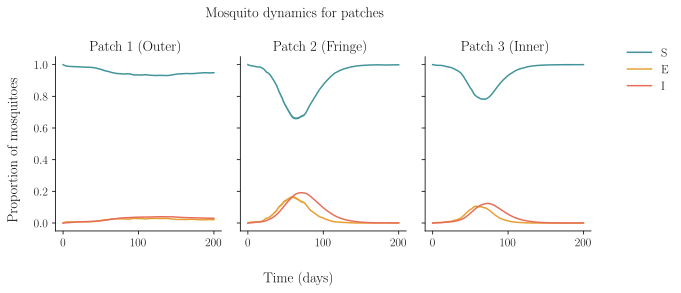

In [25]:
names = ["Patch 1 (Outer)", "Patch 2 (Fringe)", "Patch 3 (Inner)"]
labels= ["S", "E", "I"]

fig, axs = plt.subplots(nrows=1, ncols=3, sharey=True, figsize=(8.5,4))
cur_name = 0

for i, col in enumerate(axs):
    for j, c, l in zip(range(len(axs)), ["#41949A", "#e79f31", "#E56E5A", "#7384BB"], labels):
        if i == 0:
            axs[i].plot(np.arange(0, m.total_time, m.timestep), data["patch_sei"][i].T[j]/m.K_v_arr[i], color=c, label=l)
        else:
            axs[i].plot(np.arange(0, m.total_time, m.timestep), data["patch_sei"][i].T[j]/m.K_v_arr[i], color=c)
#     for (i, color, args) in zip(range(3), range(1,4), ["steelblue", "green", "red"], [{}, {"marker": "o", "markevery": 15}, {"linestyle": "dashed"}]):
#         sns.kdeplot(peak_infection_times[temp_names[cur_name]][patch], ax=col, bw_adjust=.5, color=color, label=f"Patch {name}" if cur_name == 0 else None, **args)

#     col.set_xlim(0,200)
    
#     col.set_xlabel("")
#     col.set_ylabel("")

    col.set_title(names[i])
    
#     cur_name += 1

fig.suptitle("Mosquito dynamics for patches")

fig.supxlabel("Time (days)")
fig.supylabel("Proportion of mosquitoes")
fig.legend(bbox_to_anchor=[1.12, 0.875])
fig.tight_layout()
plt.savefig("img/v3_3_0itn_mosq", dpi=330)

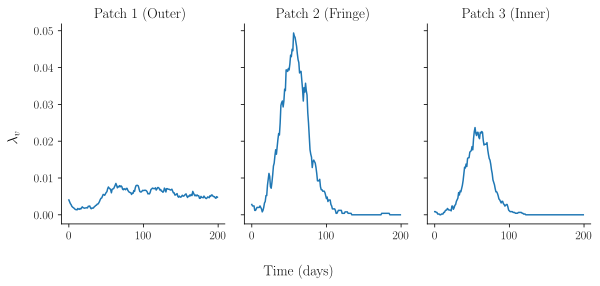

In [26]:
fig, axs = plt.subplots(nrows=1, ncols=3, sharey=True, figsize=(8.5,4))
cur_name = 0

for i, col in enumerate(axs):
    axs[i].plot(data['time'][::12], data["lambda_v"][i][::12])
    col.set_title(names[i])

fig.supxlabel(r"Time (days)")
fig.supylabel(r"$\lambda_v$")
fig.tight_layout()
plt.savefig("img/lambda_v_patch", dpi=330)

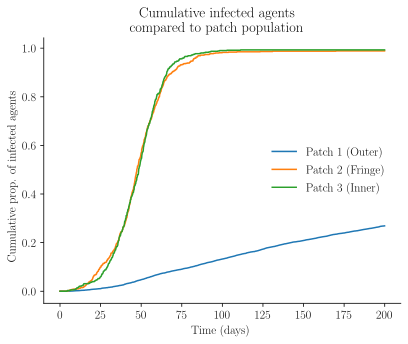

In [27]:
df = pd.DataFrame(data["infection_records"])
patch_pops = [np.sum([a.node.patch_id == j for a in m.agents]) for j in range(3)]

for i in range(3):
    vals = np.zeros(m.tick_counter)
    infs = df[df.home_patch == i].groupby(by=['time']).size().reset_index()
    vals[infs.time] = infs.iloc[:, 1]
    
    plt.plot(np.arange(0, m.total_time, m.timestep),
             vals.cumsum()/patch_pops[i],
            label=names[i])

plt.title("Cumulative infected agents\ncompared to patch population")
plt.xlabel("Time (days)")
plt.ylabel("Cumulative prop. of infected agents")
plt.legend()
plt.savefig("img/patch_infections_t", dpi=330)

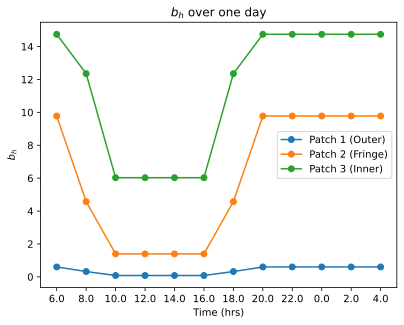

In [23]:
df = pd.DataFrame(data["patch_values"])
tick_start = 27 * 1
t = np.arange(start_time:=(tick_start*m.timestep*24 % 24), # time in simulation (hrs)
              start_time+24, # 1 day window
              step=24*m.timestep)

for i in range(3):
    plt.plot(t,
             df[df.patch_id == i].b_h.reset_index(drop=True)[tick_start:tick_start+int(1/m.timestep)],
            'o-',
            label=names[i]) #TODO: plot actual time, compare patches.
plt.xticks(t, labels=t % 24)

plt.title(r"$b_h$ over one day")
plt.xlabel("Time (hrs)")
plt.ylabel(r"$b_h$")
plt.legend()
plt.savefig("img/b_h_patch", dpi=330)

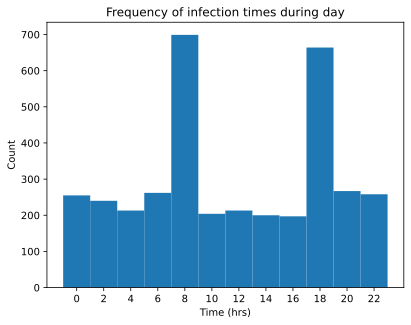

In [24]:
df = pd.DataFrame(data["infection_records"])

total=np.unique(((df.time * m.timestep * 24) % 24).map(np.round), return_counts=True)[1].sum()
# plt.hist((df.time * m.timestep * 24) % 24, bins=12)
plt.bar(np.arange(0,24,2), np.unique(((df.time * m.timestep * 24) % 24).map(np.round), return_counts=True)[1], width=2)
plt.xticks(np.arange(0,24,2))
plt.title("Frequency of infection times during day")
plt.xlabel("Time (hrs)")
plt.ylabel("Count")

plt.savefig("img/infection_times", dpi=330)

In [25]:
tick_counter = 1528
timestep = 2/24

time_in_hrs = tick_counter*(timestep*24) % 24
print(time_in_hrs, (time_in_hrs >= 18) or (time_in_hrs <= 8))

8.0 True


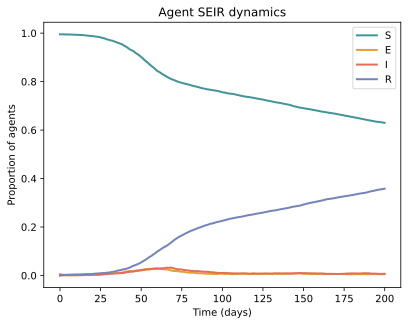

In [26]:
for j, c in zip(range(4), ["#41949A", "#e79f31", "#E56E5A", "#7384BB"]):
    plt.plot(np.arange(0, m.total_time, m.timestep), np.sum(data["agent_disease_counts"],axis=0)[j]/m.num_agents, color=c, lw=2, label=(labels+["R"])[j])
plt.xlabel("Time (days)")
plt.ylabel("Proportion of agents")
plt.title("Agent SEIR dynamics")
plt.legend()
# plt.xlim(85,100)
plt.savefig("img/v3_3_0itn_agent",dpi=330)

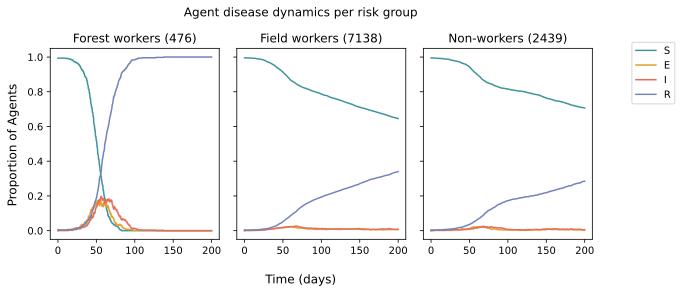

In [27]:
amts = (np.sum([a.forest_worker for a in m.agents]),
        np.sum([a.field_worker for a in m.agents]),
        np.sum([not (a.forest_worker or a.field_worker) for a in m.agents]))
names = ["Forest workers", "Field workers", "Non-workers"]
labels= ["S", "E", "I", "R"]

fig, axs = plt.subplots(nrows=1, ncols=3, sharey=True, figsize=(8.5,4))
cur_name = 0

for i, col in enumerate(axs):
    for j, c, l in zip(range(len(labels)), ["#41949A", "#e79f31", "#E56E5A", "#7384BB"], labels):
        if i == 0:
            axs[i].plot(np.arange(0, m.total_time, m.timestep), data["agent_disease_counts"][i][j]/amts[i], color=c, label=l)
        else:
            axs[i].plot(np.arange(0, m.total_time, m.timestep), data["agent_disease_counts"][i][j]/amts[i], color=c)
    col.set_title(names[i] + f" ({amts[i]})")
    
fig.suptitle("Agent disease dynamics per risk group")

fig.supxlabel("Time (days)")
fig.supylabel("Proportion of Agents")
fig.legend(bbox_to_anchor=[1.12, 0.875])
fig.tight_layout()
plt.savefig("img/v3_3_0itn_agent_risk_groups", dpi=330)

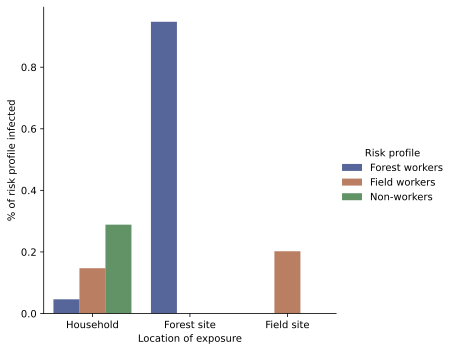

In [28]:
df = pd.DataFrame(data["infection_records"]).groupby(by=["worker_type", "activity_id"]).size().reset_index(name="num")
df["num"] = df.num.map(float)

for i, _ in df.iterrows():
    df.iloc[i, 2] /= amts[(df.iloc[i,0])]

df["worker_type"] = df.worker_type.map({0: "Forest workers", 1: "Field workers", 2: "Non-workers"})
df["activity_id"] = df.activity_id.map({0: "Household", 1: "Forest site", 2: "Field site"})

g = sns.catplot(
    data=df,
    kind="bar",
    x="activity_id",
    y="num",
    hue="worker_type",
    # errorbar="sd",
    palette="dark",
    alpha=.7,
)
# g.despine(left=True)
g.set_axis_labels("Location of exposure", "% of risk profile infected")
g.legend.set_title("Risk profile")
plt.show()

## Multiple model runs

#### Low severity

In [29]:
num_runs = 5
low_rainy = [None] * num_runs

for i in tqdm_notebook(range(num_runs)):
    m = BaselineModel(**RAINY_SEASON)
    res, _ = m.run()

    low_rainy[i] = res
    low_rainy[i]["amts"] = (np.sum([a.forest_worker for a in m.agents]),
                    np.sum([a.field_worker for a in m.agents]),
                    np.sum([not (a.forest_worker or a.field_worker) for a in m.agents]))

  0%|          | 0/5 [00:00<?, ?it/s]

(0.0, 0.2)

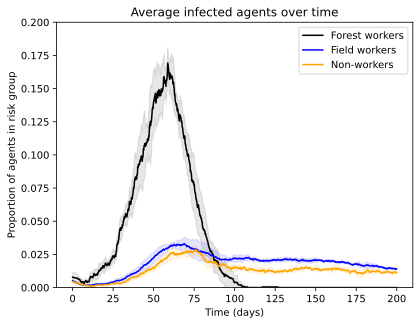

In [30]:
palette = ["black", "blue", "orange", "green"]
names = ["Forest workers", "Field workers", "Non-workers"]
# labels= ["S", "E", "I", "R"]

for j, name, c in zip(range(num_runs), names, palette):
    avgs = np.mean([low_rainy[i]["agent_disease_counts"][j][2]/low_rainy[i]['amts'][j] for i in range(num_runs)],axis=0)
    plt.plot(low_rainy[0]["time"],
             avgs,
             color=c,
            label=name)
    ci = 1.96 * np.std([low_rainy[i]["agent_disease_counts"][j][2]/low_rainy[i]['amts'][j] for i in range(num_runs)],axis=0)/np.sqrt(num_runs)
    plt.gca().fill_between(low_rainy[0]["time"],
                           np.maximum(avgs-ci, 0),
                           (avgs+ci),
                           color=c,
                           alpha=.1)
plt.title("Average infected agents over time")
plt.xlabel("Time (days)")
plt.ylabel("Proportion of agents in risk group")
plt.legend()
plt.savefig("img/avg_infect_agent", dpi=330)
plt.ylim(0,.2)

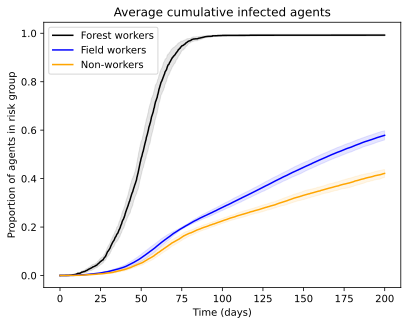

In [31]:
palette = ["black", "blue", "orange", "green"]

for j, name, c in zip(range(num_runs), names, palette):
    sums = np.cumsum([low_rainy[i]["agent_infected_unique"][j]/low_rainy[i]['amts'][j] for i in range(num_runs)],axis=1)
    avgs = np.mean(sums,axis=0)
    plt.plot(low_rainy[0]["time"],
             avgs,
             color=c,
            label=name)
    ci = 1.96 * np.std(sums,axis=0)/np.sqrt(num_runs)
    plt.gca().fill_between(low_rainy[0]["time"],
                           np.maximum(avgs-ci, 0),
                           (avgs+ci),
                           color=c,
                           alpha=.1)
plt.title("Average cumulative infected agents")
plt.xlabel("Time (days)")
plt.ylabel("Proportion of agents in risk group")
plt.legend()
plt.savefig("img/avg_cum_infect_agent", dpi=330)

In [32]:
num_runs = 5
low_dry = [None] * num_runs

for i in tqdm_notebook(range(num_runs)):
    m = BaselineModel(**DRY_SEASON)
    res, _ = m.run()

    low_dry[i] = res
    low_dry[i]["amts"] = (np.sum([a.forest_worker for a in m.agents]),
                    np.sum([a.field_worker for a in m.agents]),
                    np.sum([not (a.forest_worker or a.field_worker) for a in m.agents]))

  0%|          | 0/5 [00:00<?, ?it/s]

(0.0, 0.2)

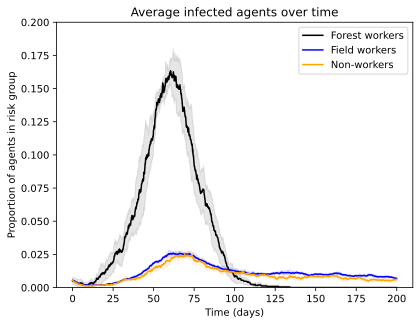

In [33]:
palette = ["black", "blue", "orange", "green"]
names = ["Forest workers", "Field workers", "Non-workers"]
# labels= ["S", "E", "I", "R"]

for j, name, c in zip(range(num_runs), names, palette):
    avgs = np.mean([low_dry[i]["agent_disease_counts"][j][2]/low_dry[i]['amts'][j] for i in range(num_runs)],axis=0)
    plt.plot(low_dry[0]["time"],
             avgs,
             color=c,
            label=name)
    ci = 1.96 * np.std([low_dry[i]["agent_disease_counts"][j][2]/low_dry[i]['amts'][j] for i in range(num_runs)],axis=0)/np.sqrt(num_runs)
    plt.gca().fill_between(low_dry[0]["time"],
                           np.maximum(avgs-ci, 0),
                           (avgs+ci),
                           color=c,
                           alpha=.1)
plt.title("Average infected agents over time")
plt.xlabel("Time (days)")
plt.ylabel("Proportion of agents in risk group")
plt.legend()
plt.savefig("img/avg_infect_agent", dpi=330)
plt.ylim(0,.2)

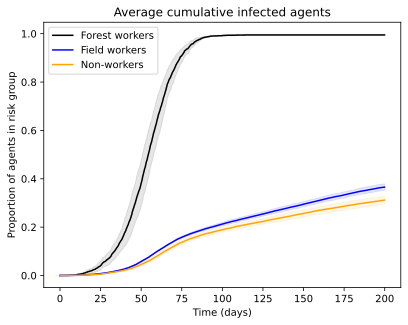

In [34]:
palette = ["black", "blue", "orange", "green"]

for j, name, c in zip(range(num_runs), names, palette):
    sums = np.cumsum([low_dry[i]["agent_infected_unique"][j]/low_dry[i]['amts'][j] for i in range(num_runs)],axis=1)
    avgs = np.mean(sums,axis=0)
    plt.plot(low_dry[0]["time"],
             avgs,
             color=c,
            label=name)
    ci = 1.96 * np.std(sums,axis=0)/np.sqrt(num_runs)
    plt.gca().fill_between(low_dry[0]["time"],
                           np.maximum(avgs-ci, 0),
                           (avgs+ci),
                           color=c,
                           alpha=.1)
plt.title("Average cumulative infected agents")
plt.xlabel("Time (days)")
plt.ylabel("Proportion of agents in risk group")
plt.legend()
plt.savefig("img/avg_cum_infect_agent", dpi=330)

#### High severity

In [35]:
RAINY_SEASON["high_severity"] = True
DRY_SEASON["high_severity"] = True

In [36]:
num_runs = 5
high_rainy = [None] * num_runs

for i in tqdm_notebook(range(num_runs)):
    m = BaselineModel(**RAINY_SEASON)
    res, _ = m.run()

    high_rainy[i] = res
    high_rainy[i]["amts"] = (np.sum([a.forest_worker for a in m.agents]),
                    np.sum([a.field_worker for a in m.agents]),
                    np.sum([not (a.forest_worker or a.field_worker) for a in m.agents]))

  0%|          | 0/5 [00:00<?, ?it/s]

(0.0, 0.2)

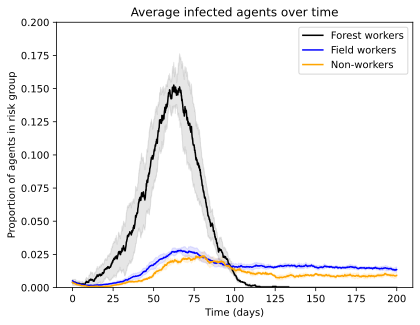

In [37]:
palette = ["black", "blue", "orange", "green"]
names = ["Forest workers", "Field workers", "Non-workers"]
# labels= ["S", "E", "I", "R"]

for j, name, c in zip(range(num_runs), names, palette):
    avgs = np.mean([high_rainy[i]["agent_disease_counts"][j][2]/high_rainy[i]['amts'][j] for i in range(num_runs)],axis=0)
    plt.plot(high_rainy[0]["time"],
             avgs,
             color=c,
            label=name)
    ci = 1.96 * np.std([high_rainy[i]["agent_disease_counts"][j][2]/high_rainy[i]['amts'][j] for i in range(num_runs)],axis=0)/np.sqrt(num_runs)
    plt.gca().fill_between(high_rainy[0]["time"],
                           np.maximum(avgs-ci, 0),
                           (avgs+ci),
                           color=c,
                           alpha=.1)
plt.title("Average infected agents over time")
plt.xlabel("Time (days)")
plt.ylabel("Proportion of agents in risk group")
plt.legend()
plt.savefig("img/avg_infect_agent", dpi=330)
plt.ylim(0,.2)

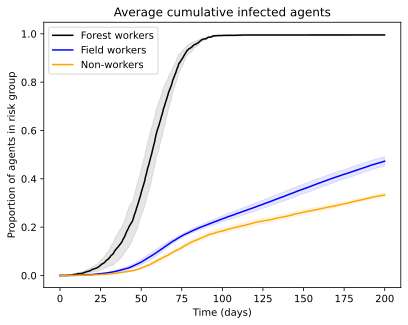

In [38]:
palette = ["black", "blue", "orange", "green"]

for j, name, c in zip(range(num_runs), names, palette):
    sums = np.cumsum([high_rainy[i]["agent_infected_unique"][j]/high_rainy[i]['amts'][j] for i in range(num_runs)],axis=1)
    avgs = np.mean(sums,axis=0)
    plt.plot(high_rainy[0]["time"],
             avgs,
             color=c,
            label=name)
    ci = 1.96 * np.std(sums,axis=0)/np.sqrt(num_runs)
    plt.gca().fill_between(high_rainy[0]["time"],
                           np.maximum(avgs-ci, 0),
                           (avgs+ci),
                           color=c,
                           alpha=.1)
plt.title("Average cumulative infected agents")
plt.xlabel("Time (days)")
plt.ylabel("Proportion of agents in risk group")
plt.legend()
plt.savefig("img/avg_cum_infect_agent", dpi=330)

In [39]:
num_runs = 5
high_dry = [None] * num_runs

for i in tqdm_notebook(range(num_runs)):
    m = BaselineModel(**DRY_SEASON)
    res, _ = m.run()

    high_dry[i] = res
    high_dry[i]["amts"] = (np.sum([a.forest_worker for a in m.agents]),
                    np.sum([a.field_worker for a in m.agents]),
                    np.sum([not (a.forest_worker or a.field_worker) for a in m.agents]))

  0%|          | 0/5 [00:00<?, ?it/s]

(0.0, 0.2)

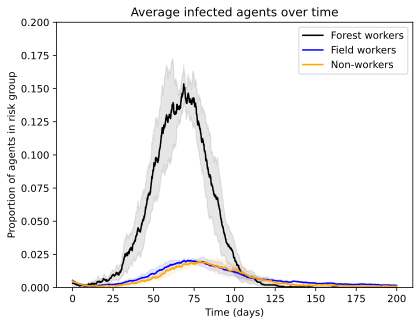

In [40]:
palette = ["black", "blue", "orange", "green"]
names = ["Forest workers", "Field workers", "Non-workers"]
# labels= ["S", "E", "I", "R"]

for j, name, c in zip(range(num_runs), names, palette):
    avgs = np.mean([high_dry[i]["agent_disease_counts"][j][2]/high_dry[i]['amts'][j] for i in range(num_runs)],axis=0)
    plt.plot(high_dry[0]["time"],
             avgs,
             color=c,
            label=name)
    ci = 1.96 * np.std([high_dry[i]["agent_disease_counts"][j][2]/high_dry[i]['amts'][j] for i in range(num_runs)],axis=0)/np.sqrt(num_runs)
    plt.gca().fill_between(high_dry[0]["time"],
                           np.maximum(avgs-ci, 0),
                           (avgs+ci),
                           color=c,
                           alpha=.1)
plt.title("Average infected agents over time")
plt.xlabel("Time (days)")
plt.ylabel("Proportion of agents in risk group")
plt.legend()
plt.savefig("img/avg_infect_agent", dpi=330)
plt.ylim(0,.2)

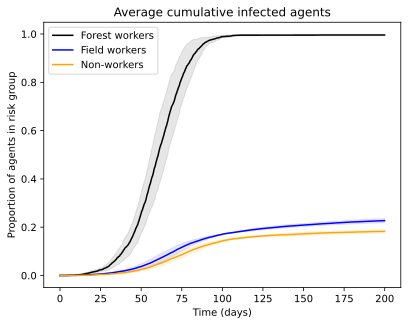

In [41]:
palette = ["black", "blue", "orange", "green"]

for j, name, c in zip(range(num_runs), names, palette):
    sums = np.cumsum([high_dry[i]["agent_infected_unique"][j]/high_dry[i]['amts'][j] for i in range(num_runs)],axis=1)
    avgs = np.mean(sums,axis=0)
    plt.plot(high_dry[0]["time"],
             avgs,
             color=c,
            label=name)
    ci = 1.96 * np.std(sums,axis=0)/np.sqrt(num_runs)
    plt.gca().fill_between(high_dry[0]["time"],
                           np.maximum(avgs-ci, 0),
                           (avgs+ci),
                           color=c,
                           alpha=.1)
plt.title("Average cumulative infected agents")
plt.xlabel("Time (days)")
plt.ylabel("Proportion of agents in risk group")
plt.legend()
plt.savefig("img/avg_cum_infect_agent", dpi=330)

### New visualisation

#### Severity vs season; agent infected counts

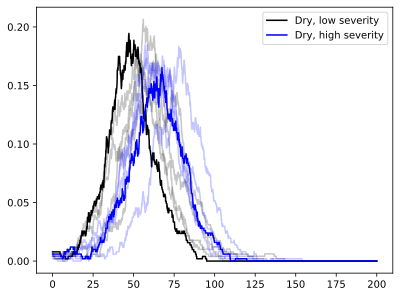

In [90]:
cmap = ["black", "blue", "orange", "green"]
names = ["Forest workers", "Field workers", "Non-workers"]

low_dry  = data.copy()    # TODO: remove once re-run
high_dry = high_df.copy() # TODO: remove once re-run

i = 0
risk_group = names[i]

hl_run = 4

for df, color, lab in zip([low_dry, high_dry],
                                  cmap,
                                  ["Dry, low severity", "Dry, high severity"]):
    for run_no, run in enumerate(df):
        plt.plot(run["time"],
                 run["agent_disease_counts"][i][2]/run['amts'][i],
                 color=color,
                 alpha=1 if hl_run == run_no else .225,
                label=lab if run_no == hl_run else None)

plt.legend()
plt.show()

# for j, name, c in zip(range(num_runs), names, palette):
#     avgs = np.mean([data[i]["agent_disease_counts"][j][2]/data[i]['amts'][j] for i in range(num_runs)],axis=0)
#     plt.plot(data[0]["time"],
#              avgs,
#              color=c,
#             label=name)
#     ci = 1.96 * np.std([data[i]["agent_disease_counts"][j][2]/data[i]['amts'][j] for i in range(num_runs)],axis=0)/np.sqrt(num_runs)
#     plt.gca().fill_between(data[0]["time"],
#                            np.maximum(avgs-ci, 0),
#                            (avgs+ci),
#                            color=c,
#                            alpha=.1)
# plt.title("Average infected agents over time")
# plt.xlabel("Time (days)")
# plt.ylabel("Proportion of agents in risk group")
# plt.legend()
# plt.savefig("img/avg_infect_agent", dpi=330)
# plt.ylim(0,.2)

In [57]:
from tol_colors import tol_cmap, tol_cset
cmap = tol_cset('high-contrast')

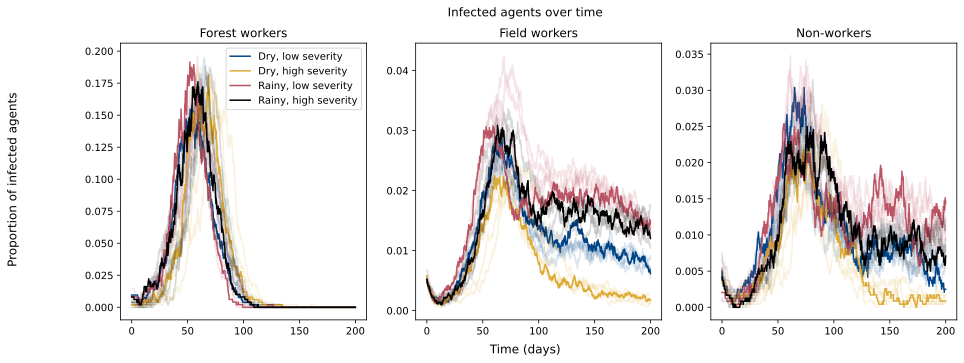

In [60]:
# TODO:
# [X] Update for all 4 dfs
# [X] Do all 3 risk groups
# [ ] Update to tol_colors (same as Manore et al replication plots)

fig, axs = plt.subplots(nrows=1, ncols=3, sharey=False, figsize=(15,5))

for i, (risk_group, hl_run, ax) in enumerate(zip(
                                        ["Forest workers", "Field workers", "Non-workers"],
                                        [4, 4, 4],
                                        axs)
                                      ):
    for df, color, lab in zip([low_dry, high_dry, low_rainy, high_rainy],
                                      cmap,
                                      ["Dry, low severity", "Dry, high severity", "Rainy, low severity", "Rainy, high severity"]):
        for run_no, run in enumerate(df):
            ax.plot(run["time"],
                     run["agent_disease_counts"][i][2]/run['amts'][i],
                     color=color,
                     alpha=1 if hl_run == run_no else .15,
                    label=lab if run_no == hl_run and i == 0 else None)
            if run_no == hl_run:
                ax.set_title(risk_group)
                if i == 0: ax.legend()

fig.suptitle("Infected agents over time")

fig.supxlabel("Time (days)")
fig.supylabel("Proportion of infected agents")
# fig.legend()
plt.savefig("img/new_viz.png", dpi=330)

# plt.title()
# plt.xlabel("Time (days)")
# plt.ylabel("Proportion of infected agents")
# plt.legend()
# plt.savefig("img/avg_infect_agent", dpi=330)
# plt.ylim(0,.2)

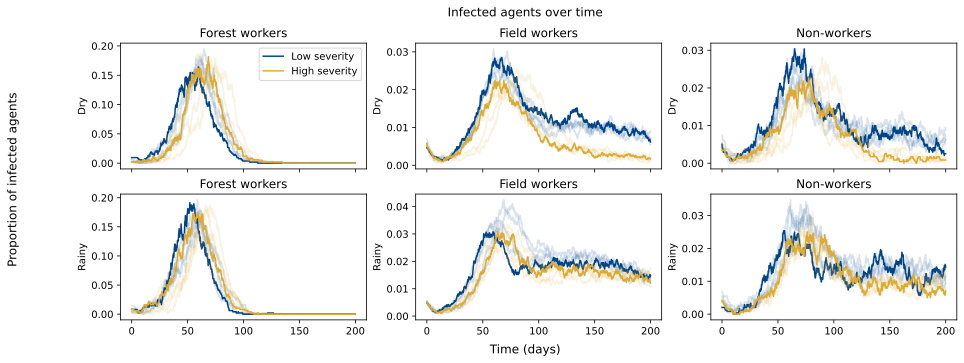

In [61]:
# TODO:
# [ ] Update for all 4 dfs
# [ ] Do all 3 risk groups
# [ ] Update to tol_colors (same as Manore et al replication plots)

fig, axs = plt.subplots(nrows=2, ncols=3, sharex=True, figsize=(15,5))

def plot_row(dfs, row, hl_runs, ylab, legend=False):
    for i, (risk_group, hl_run, ax) in enumerate(zip(
                                            ["Forest workers", "Field workers", "Non-workers"],
                                            hl_runs,
                                            row)):
        for df, color, lab in zip(dfs,
                                          cmap,
                                          ["Low severity", "High severity"]):
            for run_no, run in enumerate(df):
                ax.plot(run["time"],
                         run["agent_disease_counts"][i][2]/run['amts'][i],
                         color=color,
                         alpha=1 if hl_run == run_no else .15,
                        label=lab if run_no == hl_run and i == 0 else None)
                if run_no == hl_run:
                    ax.set_title(risk_group)
                    ax.set_ylabel(ylab)
                    if i == 0 and legend: ax.legend()

plot_row([low_dry, high_dry], axs[0], [4, 4, 4], "Dry", legend=True)
plot_row([low_rainy, high_rainy], axs[1], [4, 4, 4], "Rainy")

fig.suptitle("Infected agents over time")
fig.supxlabel("Time (days)")
fig.supylabel("Proportion of infected agents")
plt.savefig("img/new_viz.png", dpi=330)

# plt.title()
# plt.xlabel("Time (days)")
# plt.ylabel("Proportion of infected agents")
# plt.legend()
# plt.savefig("img/avg_infect_agent", dpi=330)
# plt.ylim(0,.2)

#### Scenario vs severity; cumulative infections

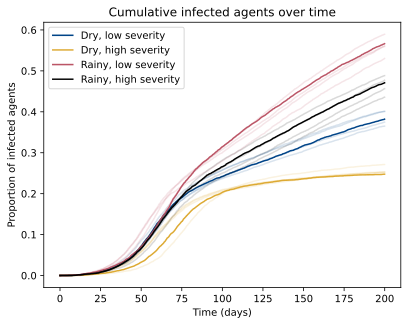

In [102]:
for df, color, lab, hl_run in zip([low_dry, high_dry, low_rainy, high_rainy],
                                  cmap,
                                  ["Dry, low severity", "Dry, high severity", "Rainy, low severity", "Rainy, high severity"],
                                  [0, 0, 1, 4]):
    for run_no, run in enumerate(df):
        plt.plot(run["time"],
                 run["agent_infected_unique"][0:3].sum(axis=0).cumsum()/10053,
                 # run["agent_disease_counts"][i][2]/run['amts'][i],
                 color=color,
                 alpha=1 if hl_run == run_no else .15,
                label=lab if run_no == hl_run else None)

plt.title("Cumulative infected agents over time")
plt.legend()
plt.xlabel("Time (days)")
plt.ylabel("Proportion of infected agents")
plt.savefig("img/new_cum_viz.png", dpi=330)

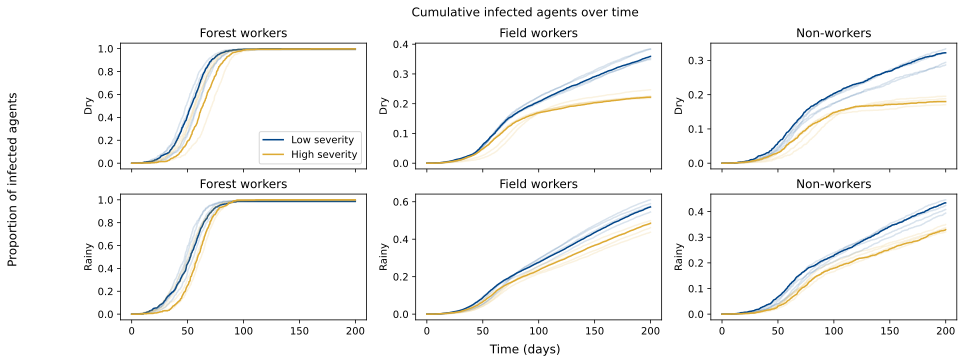

In [132]:
fig, axs = plt.subplots(nrows=2, ncols=3, sharex=True, figsize=(15,5))

def plot_row(dfs, row, hl_runs, ylab, legend=False):
    for i, (risk_group, hl_run, ax) in enumerate(zip(
                                            ["Forest workers", "Field workers", "Non-workers"],
                                            hl_runs,
                                            row)):
        for df, color, lab in zip(dfs,
                                          cmap,
                                          ["Low severity", "High severity"]):
            for run_no, run in enumerate(df):
                ax.plot(run["time"],
                         run["agent_infected_unique"][i].cumsum()/run['amts'][i],
                         # run["agent_disease_counts"][i][2]/run['amts'][i],
                         color=color,
                         alpha=1 if hl_run == run_no else .15,
                        label=lab if run_no == hl_run and i == 0 else None)
                if run_no == hl_run:
                    ax.set_title(risk_group)
                    ax.set_ylabel(ylab)
                    if i == 0 and legend: ax.legend()

plot_row([low_dry, high_dry], axs[0],     [0, 1, 4], "Dry", legend=True)
plot_row([low_rainy, high_rainy], axs[1], [1, 3, 3], "Rainy")

fig.suptitle("Cumulative infected agents over time")
fig.supxlabel("Time (days)")
fig.supylabel("Proportion of infected agents")
plt.savefig("img/new_cum_viz_2.png", dpi=330)

#### Scenario vs severity; p(behaviour)

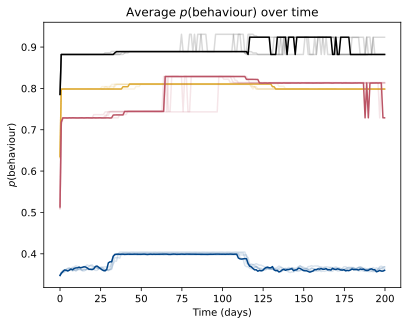

In [136]:
for df, color, lab, hl_run in zip([low_dry, high_dry, low_rainy, high_rainy],
                                  cmap,
                                  ["Dry, low severity", "Dry, high severity", "Rainy, low severity", "Rainy, high severity"],
                                  [0, 0, 1, 4]):
    for run_no, run in enumerate(df):
        plt.plot(np.array(run["time"])[run['prob_values'].nonzero()],
                 run['prob_values'][run['prob_values'].nonzero()],
                 color=color,
                 alpha=1 if hl_run == run_no else .15,
                 label=lab if run_no == hl_run else None)

plt.title(r"Average $p(\text{behaviour})$ over time")
# plt.legend()
plt.xlabel("Time (days)")
plt.ylabel(r"$p(\text{behaviour})$")
plt.savefig("img/new_p_behaviour_viz.png", dpi=330)